# Semantic Segmentation

The goal of this laboratory is to study *Semantic Segmentation* which is an image classification approach based on deep learning techniques. It involves a supervised training that is suitable when large databases with associated groundtruth are available. 

As in the last laboratory, a specific set of images is provided. It corresponds to Seismic data collected using reflection seismology. The method requires a controlled seismic source of energy, such as compressed air or a seismic vibrator, and sensors record the reflection from rock interfaces within the subsurface. Reflection seismology is similar to X-ray, sonar and echolocation. The seismic image shows the boundaries between different rock types. In theory, the strength of reflection is directly proportional to the difference in the physical properties on either side of the interface. 

The oil prospection industry uses seismic images to understand which areas beneath the Earth’s surface may contain large amounts of oil and gas. Interestingly, the surfaces which contain oil and gas, also contain huge deposits of salt. It is important in petroleum geology because salt structures are impermeable and can lead to the formation of a stratigraphic trap or salt dome.
 

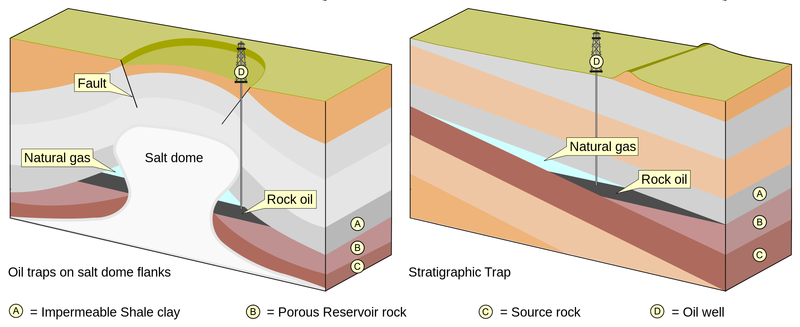

So, with the help of seismic technology, an important goal is to try to predict which areas in the surface of the Earth contain huge amount of salts. Unfortunately, seismic imaging requires expert human vision to exactly identify salt bodies. This leads to highly subjective and variable renderings. Moreover it could cause potentially dangerous situations and huge loss for the oil and gas company drillers if the human prediction is incorrect. So, in this laboratory, we will study whether semantic segmentation is able to build an algorithm that automatically and accurately identifies if a subsurface target is salt or not.

## 1 Lab configuration

Upload the "images.zip" and "masks.zip" files in the session storage (using the "Files" and "Upload" options on the upper left part of the browser). The Archives contains the image and mask material corresponding to this lab.

#### Initialization
Let us import the necessary library. Note that we will work with pytorch to implement the semantic segmentation algorithm. 

In [1]:
import os
#os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
import math
import random
#import pandas as pd
import numpy as np
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline

from tqdm import tqdm, notebook
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import init
from torch.utils.data import Dataset, DataLoader, TensorDataset
from torchvision import transforms, utils
from torchsummary import summary

Make sure that you are using the colaboratory GPU (and not the CPU)

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


#### Load the dataset
Let us unzip the dataset of images. 

In [3]:
# Uncompress the database
!unzip -q images.zip
!unzip -q masks.zip

# Set some parameters
im_width = 128
im_height = 128
border = 5

Check that you indeed have access to the images. The number of images in the database should be 4.000. 

In [4]:
ids = next(os.walk("images"))[2] # list of names all images in the given path
print("No. of images in the dataset = ", len(ids))

No. of images in the dataset =  4000


Load the images in python variables.  

In [5]:
X = np.zeros((len(ids), im_height, im_width, 1), dtype=np.float32)
y = np.zeros((len(ids), im_height, im_width, 1), dtype=np.float32)

# tqdm is used to display the progress bar
for n, id_ in notebook.tqdm(enumerate(ids), total=len(ids)):
    # Load images
    x_img = imread("images/"+id_, as_gray=True)
    x_img = resize(x_img, (128, 128, 1), mode = 'constant', preserve_range = True)
    # Load masks
    mask = imread("masks/"+id_, as_gray=True)
    mask = resize(mask, (128, 128, 1), mode = 'constant', preserve_range = True)
    # Save images
    X[n] = x_img/255.0
    y[n] = mask/255.0

  0%|          | 0/4000 [00:00<?, ?it/s]

Let us split the database in training set (90%) and validation set (10%). 

In [6]:

# Split train and valid
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.1, random_state=42)

# Pytorch tensors
X_train_T = torch.Tensor(X_train).permute(0,3,1,2)
y_train_T = torch.squeeze(torch.Tensor(y_train).permute(0,3,1,2),1)
y_train_T = np.clip(y_train_T.long(),0,1)

X_valid_T = torch.Tensor(X_valid).permute(0,3,1,2)
y_valid_T = torch.squeeze(torch.Tensor(y_valid).permute(0,3,1,2),1)
y_valid_T = np.clip(y_valid_T.long(),0,1)

valid     = X_valid_T.numpy()
gt_valid  = y_valid_T.numpy()

Finally, let us visualize random images for the database as well as their associated groundtruth mask defining salt deposit. 

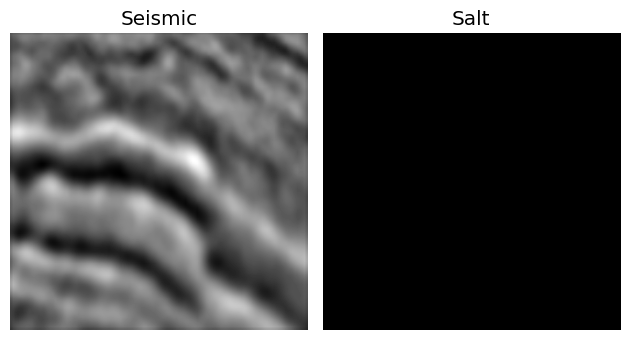

In [7]:
# Visualize random images along with their mask
ix = random.randint(0, len(X_train))
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.imshow(X_train[ix, ..., 0], cmap = 'gray', interpolation = 'bilinear')
ax1.set_title('Seismic')
ax1.axis('off')

ax2.imshow(y_train[ix].squeeze(), cmap = 'gray', interpolation = 'bilinear')
ax2.set_title('Salt')
ax2.axis('off')
fig.tight_layout()

As you can see, the identification of salt deposit is not a trivial task!

## 2 Analysis of upsampling
During the course, we have seen that one of the distinctive features of the semantic segmentation is the upsampling process. We have discussed several approaches that can be used in the context of CNN. Here we will experiment with two of them: *Upsampling* and *Transposed convolution*. 

<font color='purple'> Analyze the following code. An arbitrary tensor is created and then downsampled by a MaxPooling step. Then two upsampling strategies are proposed. In each case, some of the parameters are not defined. They are marked by ??? and your task is to specify the parameters so that the final tensors out1 and out2 have the same size as the original input tensor.  
</font>



In [8]:
# Create a random tensor 
input = torch.randn(1, 4, 128, 128)

# Downsampling
downsample = nn.MaxPool2d(kernel_size=2,stride=2)
h = downsample(input)

# Upsampling 1: Upsampling and convolution
upsample1 = nn.Upsample(scale_factor=2)
conv1     = nn.Conv2d(in_channels=4,out_channels=4,kernel_size=3,stride=1,padding=1,bias=True)
up1  = upsample1(h)
out1 = conv1(up1)

# Upsampling 2: Transposed convolution
upsample2 = nn.ConvTranspose2d(in_channels=4,out_channels=4,kernel_size=2,stride=2,padding=1,bias=True)
out2 = upsample2(h)

print('Original Tensor: ', input.shape, 'Downsampled tensor: ', h.shape)
print('Upsampling: ', up1.shape, 'Convolution: ',  out1.shape)
print('Transposed Convolution: ', out2.shape)

Original Tensor:  torch.Size([1, 4, 128, 128]) Downsampled tensor:  torch.Size([1, 4, 64, 64])
Upsampling:  torch.Size([1, 4, 128, 128]) Convolution:  torch.Size([1, 4, 128, 128])
Transposed Convolution:  torch.Size([1, 4, 126, 126])


<font color='red'>Answer: 
Since the tensor was downsampled by a factor of 2 in each dimension during the MaxPool2d step, the upsampling needs to reverse this operation by a factor of 2 in each dimension. Therefore, in conv1 teh stride should be 1 and in upsample2 the kernel_size and stride should be set to 2.


Analysis of the code: 
First, a random input tensor of size (1, 4, 128, 128) is created and then, it is downsampled using nn.MaxPool2d(), reducing the spatial dimensions of the tensor by a factor of 2. 
Next, two methods of upsampling are demonstrated:
- out1: The first method upsamples directly the tensor h by a factor of 2 and then convolution layer is then applied to the upsampled tensor.
- out2: The second method applies a transposed convolution to the tensor h, upsampling it also by a factor of 2.


</font> 

### Upsampling and Convolution
In order to get some intuition on the first upsampling strategy, the one involving simple upsampling followed by a convolution, we are going to define a toy neural network example. 

The encoding part of the network, that is the part that decreases the resolution, involves a convolution (`Conv1`), a batch normalization (`BatchNorm1`), a ReLu (`ReLu`) and a max pooling (`Maxpool`).

The decoding part increases the resolution and is composed of an upsampling (`Upsample`), a convolution (`Conv2`), a batch normalization (`BatchNorm1`), a ReLu (`ReLu`) and a final convolution (`Conv_1x1`).

<font color='purple'> The `Conv2` layer is not fully specified. Finalize its specification by using the result of the previous section.   
</font>

In [9]:
class Simple_Net_UpSample(nn.Module):
    def __init__(self,input_ch=1,output_ch=1):
        super(Simple_Net_UpSample,self).__init__()
        self.ReLu       = nn.ReLU()
        self.Maxpool    = nn.MaxPool2d(kernel_size=2,stride=2)
        
        self.Conv1      = nn.Conv2d(in_channels=1,out_channels=4,kernel_size=3,stride=1,padding=1,bias=True)
        self.BatchNorm1 = nn.BatchNorm2d(num_features=4,track_running_stats=False)
        self.Upsample   = nn.Upsample(scale_factor=2)
        self.Conv2      = nn.Conv2d(in_channels=4,out_channels=4,kernel_size=3,stride=1,padding=1,bias=True)
        self.BatchNorm2 = nn.BatchNorm2d(num_features=4,track_running_stats=False)
        
        self.Conv_1x1   = nn.Conv2d(in_channels=4,out_channels=output_ch,kernel_size=1,stride=1,padding=0)

    def forward(self,x):
        # Encoding path
        x1 = self.Conv1(x)
        x1 = self.BatchNorm1(x1)
        x1 = self.ReLu(x1)
        x1 = self.Maxpool(x1)
        
        # Decoding path
        x2 = self.Upsample(x1)
        x2 = self.Conv2(x2)
        
        x3 = self.BatchNorm1(x2)
        x3 = self.ReLu(x3)
        x4 = self.Conv_1x1(x3)

        return x4

<font color='red'>Answer: 
Based on the previous section, we know that after the upsampling operation, the spatial dimensions of the tensor are doubled. Therefore, in order to recover the original spatial dimensions, we need to use a stride of 1 in the convolutional layer Conv2. This is because the convolution operation with a stride of 1 preserves the spatial dimensions of the input tensor. 

Let us create the pytorch model and load it in the GPU.

In [10]:
model = Simple_Net_UpSample(output_ch=2)
model.to(device)

Simple_Net_UpSample(
  (ReLu): ReLU()
  (Maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (BatchNorm1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
  (Upsample): Upsample(scale_factor=2.0, mode='nearest')
  (Conv2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (BatchNorm2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
  (Conv_1x1): Conv2d(4, 2, kernel_size=(1, 1), stride=(1, 1))
)

Let us check the composition of the model. 

In [11]:
summary(model, (1, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 4, 128, 128]              40
       BatchNorm2d-2          [-1, 4, 128, 128]               8
              ReLU-3          [-1, 4, 128, 128]               0
         MaxPool2d-4            [-1, 4, 64, 64]               0
          Upsample-5          [-1, 4, 128, 128]               0
            Conv2d-6          [-1, 4, 128, 128]             148
       BatchNorm2d-7          [-1, 4, 128, 128]               8
              ReLU-8          [-1, 4, 128, 128]               0
            Conv2d-9          [-1, 2, 128, 128]              10
Total params: 214
Trainable params: 214
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 3.88
Params size (MB): 0.00
Estimated Total Size (MB): 3.94
---------------------------------------------------

Finally, let us specify the training loss and optimizer.

In [12]:
loss_fn = nn.CrossEntropyLoss()
learning_rate = 1e-3 
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
best_valid_F1 = 0

As this model is extremely simple, it will not provide interesting results in terms of classification. We will any way run some training steps to check that everything is correct and the training actually allows to decrease the loss. It is also an opportunity to build a training loop that will be used later on more complex models. 

<font color='purple'> First analyze the code to understand the various steps. Then, run the training for 4 Epochs.   
</font>

In [13]:
NEpoch = 4;    # Number of Epoch
MBsize = 32;   # Minibatch size
model.train()

it = 0
# Loop on Epoch
for t in notebook.tqdm(range(NEpoch), desc='Epoch: '):
  model.train()
  idx = torch.randperm(y_train_T.size()[0])
  X_train_T = X_train_T[idx]
  y_train_T = y_train_T[idx]
  
  running_loss = 0
  running_accu = 0
  running_TP, running_P, running_T   = 0.0, 0.0, 0.0

  # Loop on minibatch
  for n in notebook.tqdm(range(math.floor(y_train_T.shape[0]/MBsize)), desc='MiniBatch: '):
    X_train_TMB = X_train_T[n*MBsize:(n+1)*MBsize,:,:,:]
    y_train_TMB = y_train_T[n*MBsize:(n+1)*MBsize,:,:]
    X_train_TMB, y_train_TMB = X_train_TMB.to(device), y_train_TMB.to(device)
    
    # Forward pass: compute predicted y by passing x to the model.
    y_pred_TMB = model(X_train_TMB)

    # Compute the loss.
    loss = loss_fn(y_pred_TMB, y_train_TMB)
    running_loss += loss
    
    # Compute accuracy, Precision and recall
    pred    = y_pred_TMB.cpu().detach().numpy()
    pred_th = (pred[:,1,:,:]>0.5).astype(float)
    gt      = y_train_TMB.cpu().numpy()
    running_accu += (pred_th == gt).sum()/gt.size
    running_TP += ((pred_th+gt)==2).sum()
    running_P  += pred_th.sum()
    running_T  += gt.sum()
    
    # Display the loss and F1
    if n % math.floor(y_train_T.shape[0]/MBsize/5) == 0: 
      precision = running_TP/(running_P+1e-6)
      recall    = running_TP/(running_T+1e-6)
      F1        = 2*precision*recall/(precision+recall+1e-6)
      print("Epoch{0:3d}/MiniBatch{1:4d}, MB.Loss {2:1.3f}, Av.Loss {3:1.3f}, Av.F1 {4:1.3f}"\
            .format(t+1, n+1, loss.item(), running_loss/(n+1), F1))

    # Clear the past gradients and compute new gradient
    optimizer.zero_grad()
    loss.backward()

    # Update of parameters
    optimizer.step()

Epoch:   0%|          | 0/4 [00:00<?, ?it/s]

MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  1/MiniBatch   1, MB.Loss 0.877, Av.Loss 0.877, Av.F1 0.260
Epoch  1/MiniBatch  23, MB.Loss 0.757, Av.Loss 0.834, Av.F1 0.245
Epoch  1/MiniBatch  45, MB.Loss 0.734, Av.Loss 0.813, Av.F1 0.259
Epoch  1/MiniBatch  67, MB.Loss 0.751, Av.Loss 0.792, Av.F1 0.251
Epoch  1/MiniBatch  89, MB.Loss 0.716, Av.Loss 0.771, Av.F1 0.236
Epoch  1/MiniBatch 111, MB.Loss 0.630, Av.Loss 0.751, Av.F1 0.218


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  2/MiniBatch   1, MB.Loss 0.644, Av.Loss 0.644, Av.F1 0.060
Epoch  2/MiniBatch  23, MB.Loss 0.609, Av.Loss 0.627, Av.F1 0.066
Epoch  2/MiniBatch  45, MB.Loss 0.575, Av.Loss 0.613, Av.F1 0.066
Epoch  2/MiniBatch  67, MB.Loss 0.610, Av.Loss 0.601, Av.F1 0.061
Epoch  2/MiniBatch  89, MB.Loss 0.547, Av.Loss 0.594, Av.F1 0.057
Epoch  2/MiniBatch 111, MB.Loss 0.597, Av.Loss 0.588, Av.F1 0.053


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  3/MiniBatch   1, MB.Loss 0.554, Av.Loss 0.554, Av.F1 0.037
Epoch  3/MiniBatch  23, MB.Loss 0.588, Av.Loss 0.543, Av.F1 0.037
Epoch  3/MiniBatch  45, MB.Loss 0.600, Av.Loss 0.544, Av.F1 0.032
Epoch  3/MiniBatch  67, MB.Loss 0.488, Av.Loss 0.540, Av.F1 0.031
Epoch  3/MiniBatch  89, MB.Loss 0.541, Av.Loss 0.537, Av.F1 0.027
Epoch  3/MiniBatch 111, MB.Loss 0.531, Av.Loss 0.538, Av.F1 0.026


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  4/MiniBatch   1, MB.Loss 0.523, Av.Loss 0.523, Av.F1 0.016
Epoch  4/MiniBatch  23, MB.Loss 0.506, Av.Loss 0.523, Av.F1 0.016
Epoch  4/MiniBatch  45, MB.Loss 0.479, Av.Loss 0.523, Av.F1 0.014
Epoch  4/MiniBatch  67, MB.Loss 0.495, Av.Loss 0.526, Av.F1 0.015
Epoch  4/MiniBatch  89, MB.Loss 0.597, Av.Loss 0.528, Av.F1 0.013
Epoch  4/MiniBatch 111, MB.Loss 0.529, Av.Loss 0.526, Av.F1 0.012



This code trains the simple neural network model using stochastic gradient descent. The training is done for a specified number of epochs and in each epoch, the training data is shuffled and divided into minibatches of specified size. For each minibatch, the forward pass is done by passing the input through the neural network to get the predicted output. Then, the loss is calculated using a loss function (in this case, binary cross-entropy loss). The accuracy, precision, and recall are also computed for each minibatch. The gradients of the loss function with respect to the network parameters are then computed using backpropagation, and the optimizer updates the network parameters to minimize the loss.

In each minibatch, the loss, average loss, and average F1 score are printed. The F1 score is a metric that takes into account both precision and recall, and is useful for imbalanced datasets where one class is much more prevalent than the other.

After 4 epochs, the model should be trained and the loss should have decreased.

You should see that the average loss (Av.Loss) is decreasing. The F1 value may be very low (even equal to 0) as the model is not really appropriate for the task.

Now we are going to have a look at the activations along the model. For that we need to define `hook` functions (In pytorch, `hooks` are functions that are executed when a call is executed) as well as a specific visualization function to handle activations with multiple channels. 

In [14]:
activation = {}
def get_activation(name):
    def hook(model, input, output):
        activation[name] = output.detach()
    return hook

def get_pre_activation(name):
    def hook(model, input):
        activation[name] = input
    return hook
  
def custom_viz(kernels, path=None, columns=8):  
  N = kernels.shape[0]
  C = kernels.shape[1]
  P = kernels.shape[2]
  Tot = N*C

  rows = Tot // columns 
  rows += Tot % columns
  pos  = range(1,Tot + 1)

  fig = plt.figure(1)
  #fig.tight_layout()
  k=0
  for i in range(kernels.shape[0]):
    for j in range(kernels.shape[1]):
      img = kernels[i][j]
      ax = fig.add_subplot(rows,columns,pos[k])
      ax.imshow(img, cmap='gray')
      plt.axis('off')
      k = k+1

  ax.figure.set_size_inches(4*columns*P/100, 4*rows*P/100)
  
  if path:
    plt.savefig(path)
    
  plt.show()

Then, we register the hooks on specific layers of the model. These hooks are executed after the function is called. Therefore, they allow us to see the activations at the output of the layer. The names appearing in the hooks refer to the layers of the summary used above (`summary(model, (1, 128, 128))`)

In [15]:
model.Conv1.register_forward_hook(get_activation('Conv2d-1'))
model.Maxpool.register_forward_hook(get_activation('MaxPool2d-4'))
model.Upsample.register_forward_hook(get_activation('Upsample-5'))
model.Conv2.register_forward_hook(get_activation('Conv2d-6'))
model.Conv_1x1.register_forward_hook(get_activation('Conv2d-8'))

Let us choose a specific input image of the training set and display it together with its corresponding mask. 

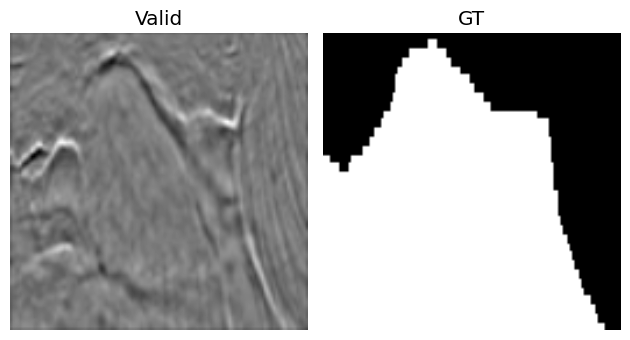

In [16]:
# Number of the training set image 
ima = 13
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(valid[ima,0,:,:], cmap = 'gray', interpolation = 'bilinear')
ax1.set_title('Valid')
ax1.axis('off')
ax2.imshow(gt_valid[ima,:,:], cmap = 'gray', interpolation = 'bilinear')
ax2.set_title('GT')
ax2.axis('off')
fig.tight_layout()

Finally, we run the image through the model and display the activations on all layers having a hook. 

Layer: Conv2d-1 torch.Size([1, 4, 128, 128])


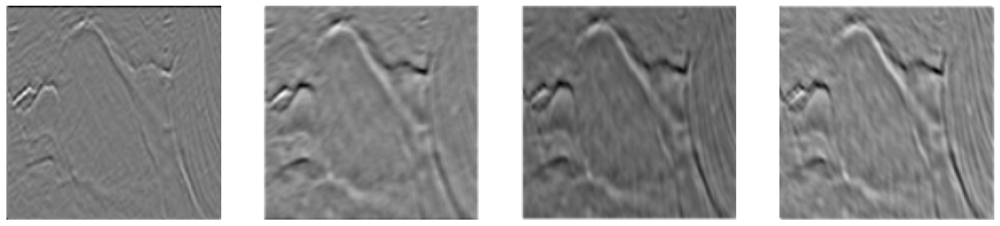

Layer: MaxPool2d-4 torch.Size([1, 4, 64, 64])


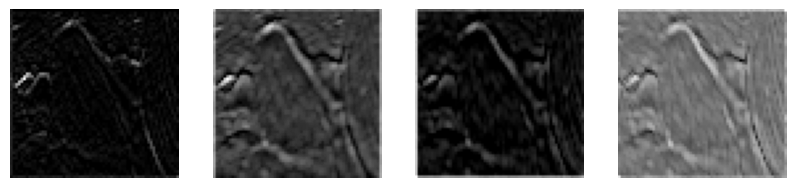

Layer: Upsample-5 torch.Size([1, 4, 128, 128])


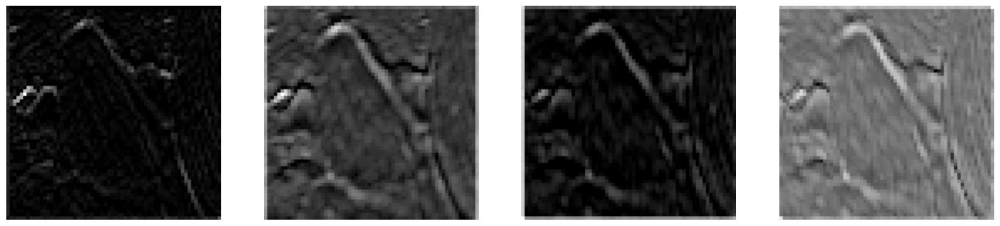

Layer: Conv2d-6 torch.Size([1, 4, 128, 128])


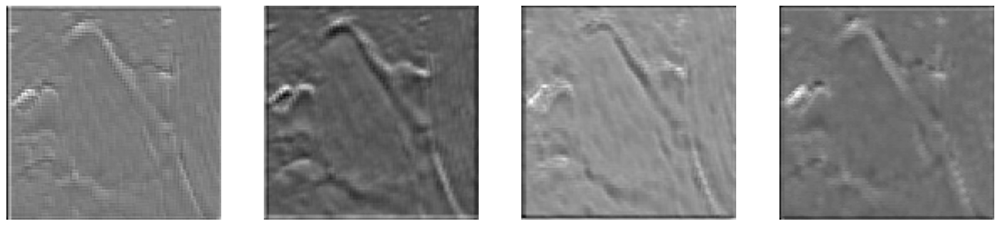

Layer: Conv2d-8 torch.Size([1, 2, 128, 128])


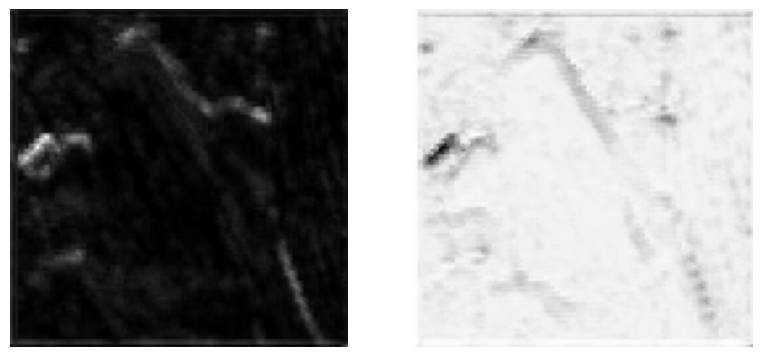

In [17]:
prediction = model(X_valid_T[ima:ima+1,:,:,:].to(device))

hook_name = 'Conv2d-1'
print('Layer: ' + hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

hook_name = 'MaxPool2d-4'
print('Layer: ' + hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

hook_name = 'Upsample-5'
print('Layer: ' + hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

hook_name = 'Conv2d-6'
print('Layer: ' + hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

hook_name = 'Conv2d-8'
print('Layer: ' + hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

### Transposed Convolution
Now, we are going to make a similar experiment with a transposed convolution instead of Upsampling & Convolution. Let us define the model.

<font color='purple'> The `ConvTr1` layer is not fully specified. Finalize its specification by using the result of the work previously done.   
</font>

Assuming that we want the transposed convolution to have the same effect as an upsample of size 2 followed by a convolution with a kernel size of 3 and a stride of 1 and padding of 1, the specification for ConvTr1 layer would be:

In [18]:
class Simple_Net_TrConv(nn.Module):
    def __init__(self,input_ch=1,output_ch=1):
        super(Simple_Net_TrConv,self).__init__()
        self.ReLu       = nn.ReLU()
        self.Maxpool    = nn.MaxPool2d(kernel_size=2,stride=2)
        
        self.Conv1      = nn.Conv2d(in_channels=1,out_channels=4,kernel_size=3,stride=1,padding=1,bias=True)
        self.BatchNorm1 = nn.BatchNorm2d(num_features=4,track_running_stats=False)
        self.ConvTr1    = nn.ConvTranspose2d(in_channels=4,out_channels=4,kernel_size=4,stride=2,padding=1,bias=True)
        self.BatchNorm2 = nn.BatchNorm2d(num_features=4,track_running_stats=False)
        
        self.Conv_1x1   = nn.Conv2d(in_channels=4,out_channels=output_ch,kernel_size=1,stride=1,padding=0)

    def forward(self,x):
        # Encoding path
        x1 = self.Conv1(x)
        x1 = self.BatchNorm1(x1)
        x1 = self.ReLu(x1)
        x1 = self.Maxpool(x1)
        
        # Decoding path
        x2 = self.ConvTr1(x1)
        
        x3 = self.BatchNorm1(x2)
        x3 = self.ReLu(x3)
        x4 = self.Conv_1x1(x3)

        return x4

This creates a transposed convolutional layer that takes a 4-channel input, upsamples it by a factor of 2, and then convolves it with a 3x3 kernel with a stride of 1 and padding of 1. The output padding of 1 is added to ensure that the size of the output matches the size of the input.

Model definition

In [19]:
model = Simple_Net_TrConv(output_ch=2)
model.to(device)

Simple_Net_TrConv(
  (ReLu): ReLU()
  (Maxpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv1): Conv2d(1, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (BatchNorm1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
  (ConvTr1): ConvTranspose2d(4, 4, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (BatchNorm2): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
  (Conv_1x1): Conv2d(4, 2, kernel_size=(1, 1), stride=(1, 1))
)

In [20]:
summary(model, (1, 128, 128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 4, 128, 128]              40
       BatchNorm2d-2          [-1, 4, 128, 128]               8
              ReLU-3          [-1, 4, 128, 128]               0
         MaxPool2d-4            [-1, 4, 64, 64]               0
   ConvTranspose2d-5          [-1, 4, 128, 128]             260
       BatchNorm2d-6          [-1, 4, 128, 128]               8
              ReLU-7          [-1, 4, 128, 128]               0
            Conv2d-8          [-1, 2, 128, 128]              10
Total params: 326
Trainable params: 326
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.06
Forward/backward pass size (MB): 3.38
Params size (MB): 0.00
Estimated Total Size (MB): 3.44
----------------------------------------------------------------


In [21]:
loss_fn = nn.CrossEntropyLoss()
learning_rate = 1e-3 
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
best_valid_F1 = 0

In [22]:
NEpoch = 4;   # Number of Epoch
MBsize = 32;   # Minibatch size
model.train()

it = 0
# Loop on Epoch
for t in notebook.tqdm(range(NEpoch), desc='Epoch: '):
  model.train()
  idx = torch.randperm(y_train_T.size()[0])
  X_train_T = X_train_T[idx]
  y_train_T = y_train_T[idx]
  
  running_loss = 0
  running_accu = 0
  running_TP, running_P, running_T   = 0.0, 0.0, 0.0

  # Loop on Minibach
  for n in notebook.tqdm(range(math.floor(y_train_T.shape[0]/MBsize)), desc='MiniBatch: '):
    X_train_TMB = X_train_T[n*MBsize:(n+1)*MBsize,:,:,:]
    y_train_TMB = y_train_T[n*MBsize:(n+1)*MBsize,:,:]
    X_train_TMB, y_train_TMB = X_train_TMB.to(device), y_train_TMB.to(device)
    
    # Forward pass: compute predicted y by passing x to the model.
    y_pred_TMB = model(X_train_TMB)

    # Compute the loss.
    loss = loss_fn(y_pred_TMB, y_train_TMB)
    running_loss += loss
    
    # Compute accuracy, Precision and recall
    pred    = y_pred_TMB.cpu().detach().numpy()
    pred_th = (pred[:,1,:,:]>0.5).astype(float)
    gt      = y_train_TMB.cpu().numpy()
    running_accu += (pred_th == gt).sum()/gt.size
    running_TP += ((pred_th+gt)==2).sum()
    running_P  += pred_th.sum()
    running_T  += gt.sum()
    
    # Display the loss and F1
    if n % math.floor(y_train_T.shape[0]/MBsize/5) == 0: 
      precision = running_TP/(running_P+1e-6)
      recall    = running_TP/(running_T+1e-6)
      F1        = 2*precision*recall/(precision+recall+1e-6)
      print("Epoch{0:3d}/MiniBatch{1:4d}, MB.Loss {2:1.3f}, Av.Loss {3:1.3f}, Av.F1 {4:1.3f}"\
            .format(t+1, n+1, loss.item(), running_loss/(n+1), F1))

    # Clear the past gradients and compute new gradient
    optimizer.zero_grad()
    loss.backward()

    # Update of parameters
    optimizer.step()

Epoch:   0%|          | 0/4 [00:00<?, ?it/s]

MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  1/MiniBatch   1, MB.Loss 0.763, Av.Loss 0.763, Av.F1 0.007
Epoch  1/MiniBatch  23, MB.Loss 0.702, Av.Loss 0.724, Av.F1 0.002
Epoch  1/MiniBatch  45, MB.Loss 0.663, Av.Loss 0.702, Av.F1 0.001
Epoch  1/MiniBatch  67, MB.Loss 0.644, Av.Loss 0.683, Av.F1 0.001
Epoch  1/MiniBatch  89, MB.Loss 0.647, Av.Loss 0.667, Av.F1 0.001
Epoch  1/MiniBatch 111, MB.Loss 0.598, Av.Loss 0.653, Av.F1 0.000


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  2/MiniBatch   1, MB.Loss 0.597, Av.Loss 0.597, Av.F1 0.000
Epoch  2/MiniBatch  23, MB.Loss 0.593, Av.Loss 0.576, Av.F1 0.000
Epoch  2/MiniBatch  45, MB.Loss 0.561, Av.Loss 0.569, Av.F1 0.000
Epoch  2/MiniBatch  67, MB.Loss 0.572, Av.Loss 0.566, Av.F1 0.000
Epoch  2/MiniBatch  89, MB.Loss 0.565, Av.Loss 0.559, Av.F1 0.000
Epoch  2/MiniBatch 111, MB.Loss 0.563, Av.Loss 0.557, Av.F1 0.000


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  3/MiniBatch   1, MB.Loss 0.558, Av.Loss 0.558, Av.F1 0.000
Epoch  3/MiniBatch  23, MB.Loss 0.568, Av.Loss 0.535, Av.F1 0.000
Epoch  3/MiniBatch  45, MB.Loss 0.622, Av.Loss 0.536, Av.F1 0.000
Epoch  3/MiniBatch  67, MB.Loss 0.485, Av.Loss 0.527, Av.F1 0.000
Epoch  3/MiniBatch  89, MB.Loss 0.516, Av.Loss 0.523, Av.F1 0.000
Epoch  3/MiniBatch 111, MB.Loss 0.457, Av.Loss 0.521, Av.F1 0.000


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  4/MiniBatch   1, MB.Loss 0.511, Av.Loss 0.511, Av.F1 0.000
Epoch  4/MiniBatch  23, MB.Loss 0.451, Av.Loss 0.488, Av.F1 0.000
Epoch  4/MiniBatch  45, MB.Loss 0.513, Av.Loss 0.491, Av.F1 0.000
Epoch  4/MiniBatch  67, MB.Loss 0.522, Av.Loss 0.501, Av.F1 0.000
Epoch  4/MiniBatch  89, MB.Loss 0.611, Av.Loss 0.500, Av.F1 0.000
Epoch  4/MiniBatch 111, MB.Loss 0.496, Av.Loss 0.501, Av.F1 0.000


Let us register the `Hooks` on various layers. 

In [23]:
model.Conv1.register_forward_hook(get_activation('Conv2d-1'))
model.Maxpool.register_forward_hook(get_activation('MaxPool2d-4'))
model.ConvTr1.register_forward_hook(get_activation('ConvTranspose2d-5'))
model.Conv_1x1.register_forward_hook(get_activation('Conv2d-8'))

Finally, let us visualize the activations. 

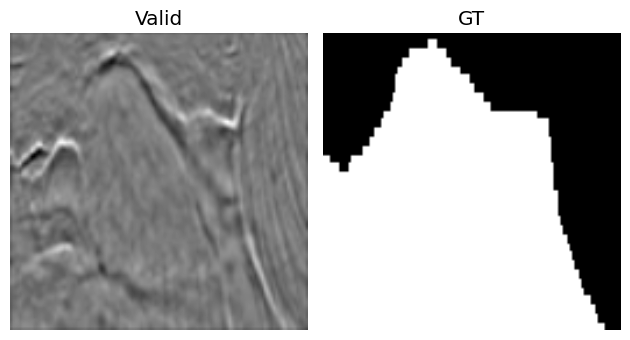

In [24]:
ima = 13
fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.imshow(valid[ima,0,:,:], cmap = 'gray', interpolation = 'bilinear')
ax1.set_title('Valid')
ax1.axis('off')
ax2.imshow(gt_valid[ima,:,:], cmap = 'gray', interpolation = 'bilinear')
ax2.set_title('GT')
ax2.axis('off')
fig.tight_layout()

We can see by this output that the GT expected was obtained.

Conv2d-1 torch.Size([1, 4, 128, 128])


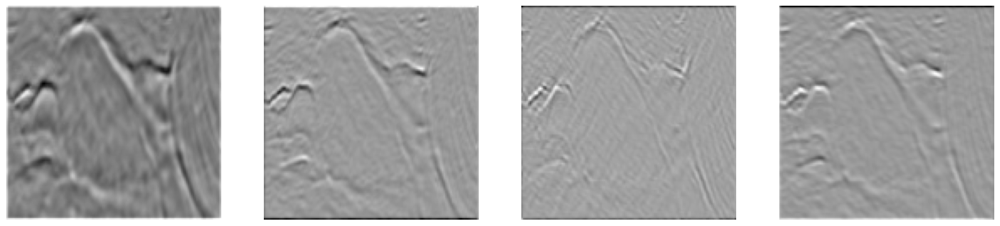

MaxPool2d-4 torch.Size([1, 4, 64, 64])


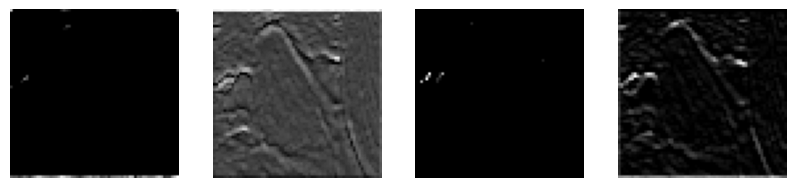

ConvTranspose2d-5 torch.Size([1, 4, 128, 128])


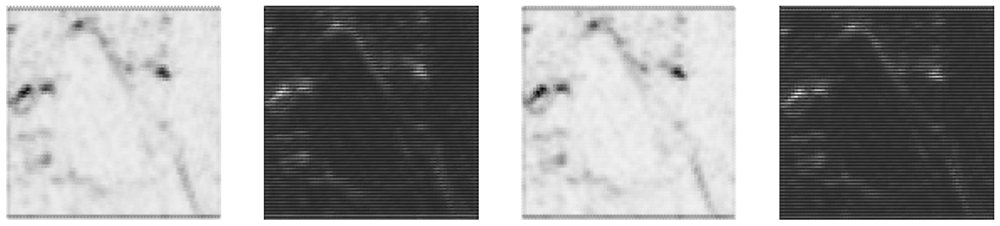

Conv2d-8 torch.Size([1, 2, 128, 128])


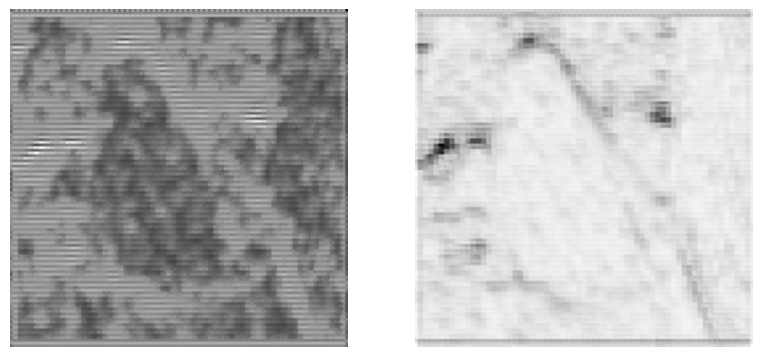

In [25]:
prediction = model(X_valid_T[ima:ima+1,:,:,:].to(device))

hook_name = 'Conv2d-1'
print(hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

hook_name = 'MaxPool2d-4'
print(hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

hook_name = 'ConvTranspose2d-5'
print(hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

hook_name = 'Conv2d-8'
print(hook_name, activation[hook_name].shape)
custom_viz(activation[hook_name].cpu().detach().clone(), hook_name + '.png',8)

<font color='purple'> It is difficult to judge the quality of the resulting upsampling processes as the models are very simple, not appropriate for the task and severely undertrained. Anyway, what can be said about their differences (Hint: Take also into consideration the information provided by the `summary`): </font>

---
<font color='red'>Answer: 
From de class codes:
The main difference between these two models is in the way they perform upsampling.

In Simple_Net_UpSample (model 1), the upsampling operation is performed using the nn.Upsample function. Then, a 3x3 convolutional layer is used to further refine the upsampled feature maps before performing the final 1x1 convolutional layer.

In contrast, in Simple_Net_TrConv (model 2), the upsampling operation is performed using the nn.ConvTranspose2d function, which learns to upsample the feature maps during training. In this case, a 4x4 transposed convolutional layer with a stride of 2 is used for upsampling. After upsampling, a 3x3 convolutional layer is applied, followed by the final 1x1 convolutional layer.

From the summaries:

- Model 1 has a total of 214 parameters, while Model 2 has 326 parameters.
- Model 1 uses nn.Upsample followed by nn.Conv2d for upsampling, while Model 2 uses nn.ConvTranspose2d.
- Model 1 has a smaller forward/backward pass size (3.88 MB) compared to Model 2 (3.38 MB).
- Both models have the same input and output shapes, as well as the same number of input and output channels.
Based on the above information, we can say that the first model is simpler and more lightweight than the second. However, Model 2 may lead to better accuracy due to the use of transposed convolution, which can learn more complex features.

Finally, taking a look at the output of the activations, I considered that the transposed convolution gives better results as it they are a little more detailed. That is because the transposed convolution generally provides more detailed activations compared to upsampling because it learns to upsample and fill in the details during training (meaning that a model using it will have more parameters).
</font> 

## 3 Network inspired by the *UNet*
In this section, we are going to create two networks inspired by the UNet model. This model is based on an encoder / decoder architecture. 
 

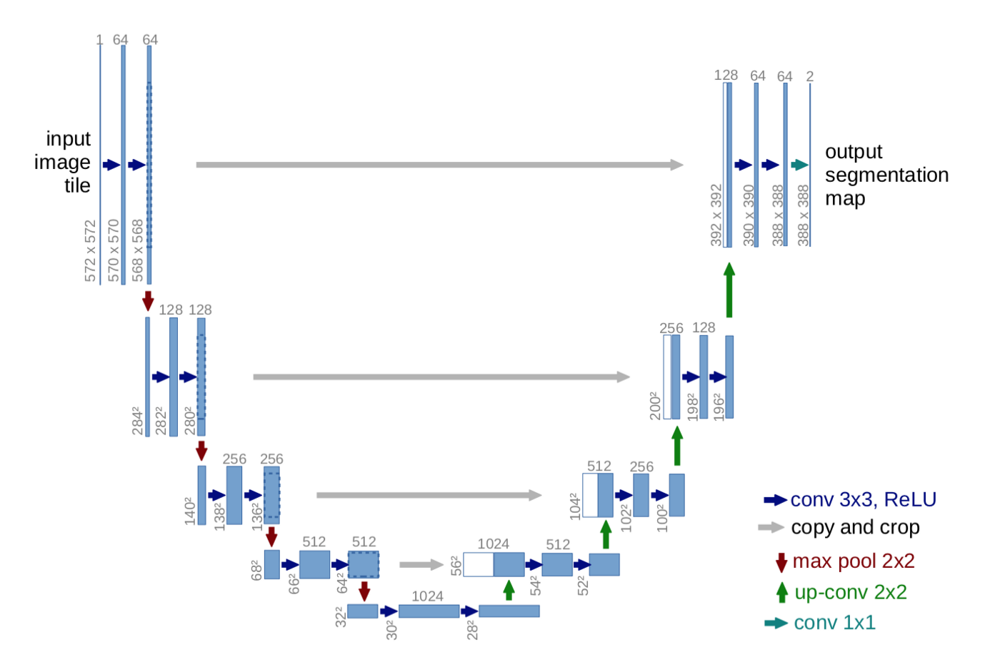

The encoder is composed of blocks involving two Convolution layers with 3x3 filters and two ReLu layers. For our model, we will also add two Batch Normalization Layers after each convolution. This part of the model architecture is represented by the following 'conv_block' class. 

In [26]:
class conv_block(nn.Module):
    def __init__(self,ch_in,ch_out):
        super(conv_block,self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(ch_in, ch_out, kernel_size=3,stride=1,padding=1,bias=True),
            nn.BatchNorm2d(ch_out,track_running_stats=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(ch_out, ch_out, kernel_size=3,stride=1,padding=1,bias=True),
            nn.BatchNorm2d(ch_out,track_running_stats=False),
            nn.ReLU(inplace=True)
        )

    def forward(self,x):
        x = self.conv(x)
        return x


For the decoder part, we will create two set of blocks with the same functionality. The first one (`up_conv`) is composed of an upsampling layer and a convolution. We also add a Batch Normalization and a ReLu layer. 

In [27]:
class up_conv(nn.Module):
    def __init__(self,ch_in,ch_out):
        super(up_conv,self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(ch_in,ch_out,kernel_size=3,stride=1,padding=1,bias=True),
		        nn.BatchNorm2d(ch_out,track_running_stats=False),
			      nn.ReLU(inplace=True)
        )

    def forward(self,x):
        x = self.up(x)
        return x

A similar block is created by substituting the upsampling and convolution by a transposed convolution. This block is called `up_Tr_conv`.

In [28]:
class up_Tr_conv(nn.Module):
    def __init__(self,ch_in,ch_out):
        super(up_Tr_conv,self).__init__()
        self.up = nn.Sequential(
            nn.ConvTranspose2d(ch_in,ch_out,kernel_size=4,stride=2,padding=1,bias=True),
		        nn.BatchNorm2d(ch_out,track_running_stats=False),
			      nn.ReLU(inplace=True)
        )

    def forward(self,x):
        x = self.up(x)
        return x

As a result, two different models are created. The first one is called `U_Net_Up` and involves the Upsampling and Convolution layers. Note that the number of channels is significantly smaller than that of the original UNet model. Also we have introduced the concatenation layers that merge encoder activations with decoder activations (see the `torch.cat((.,.),dim=1)`). 

In [29]:
class U_Net_Up(nn.Module):
    def __init__(self,img_ch=1,output_ch=1):
        super(U_Net_Up,self).__init__()
        
        self.Maxpool = nn.MaxPool2d(kernel_size=2,stride=2)

        self.Conv1 = conv_block(ch_in=img_ch,ch_out=32)
        self.Conv2 = conv_block(ch_in=32,ch_out=64)
        self.Conv3 = conv_block(ch_in=64,ch_out=128)
        self.Conv4 = conv_block(ch_in=128,ch_out=256)
        self.Conv5 = conv_block(ch_in=256,ch_out=512)

        self.Up5 = up_conv(ch_in=512,ch_out=256)
        self.Up_conv5 = conv_block(ch_in=512, ch_out=256)

        self.Up4 = up_conv(ch_in=256,ch_out=128)
        self.Up_conv4 = conv_block(ch_in=256, ch_out=128)
        
        self.Up3 = up_conv(ch_in=128,ch_out=64)
        self.Up_conv3 = conv_block(ch_in=128, ch_out=64)
        
        self.Up2 = up_conv(ch_in=64,ch_out=32)
        self.Up_conv2 = conv_block(ch_in=64, ch_out=32)

        self.Conv_1x1 = nn.Conv2d(32,output_ch,kernel_size=1,stride=1,padding=0)


    def forward(self,x):
        # encoding path
        x1 = self.Conv1(x)

        x2 = self.Maxpool(x1)
        x2 = self.Conv2(x2)
        
        x3 = self.Maxpool(x2)
        x3 = self.Conv3(x3)

        x4 = self.Maxpool(x3)
        x4 = self.Conv4(x4)

        x5 = self.Maxpool(x4)
        x5 = self.Conv5(x5)

        # decoding + concat path
        d5 = self.Up5(x5)
        d5 = torch.cat((x4,d5),dim=1)
        
        d5 = self.Up_conv5(d5)
        
        d4 = self.Up4(d5)
        d4 = torch.cat((x3,d4),dim=1)
        d4 = self.Up_conv4(d4)

        d3 = self.Up3(d4)
        d3 = torch.cat((x2,d3),dim=1)
        d3 = self.Up_conv3(d3)

        d2 = self.Up2(d3)
        d2 = torch.cat((x1,d2),dim=1)
        d2 = self.Up_conv2(d2)

        d1 = self.Conv_1x1(d2)

        return d1


The second model: `U_Net_Tr` is the same as the previous one but it includes the Transposed convolution.  

In [30]:
class U_Net_Tr(nn.Module):
    def __init__(self,img_ch=1,output_ch=1):
        super(U_Net_Tr,self).__init__()
        
        self.Maxpool = nn.MaxPool2d(kernel_size=2,stride=2)

        self.Conv1 = conv_block(ch_in=img_ch,ch_out=32)
        self.Conv2 = conv_block(ch_in=32,ch_out=64)
        self.Conv3 = conv_block(ch_in=64,ch_out=128)
        self.Conv4 = conv_block(ch_in=128,ch_out=256)
        self.Conv5 = conv_block(ch_in=256,ch_out=512)

        self.Up5 = up_Tr_conv(ch_in=512,ch_out=256)
        self.Up_conv5 = conv_block(ch_in=512, ch_out=256)

        self.Up4 = up_Tr_conv(ch_in=256,ch_out=128)
        self.Up_conv4 = conv_block(ch_in=256, ch_out=128)
        
        self.Up3 = up_Tr_conv(ch_in=128,ch_out=64)
        self.Up_conv3 = conv_block(ch_in=128, ch_out=64)
        
        self.Up2 = up_Tr_conv(ch_in=64,ch_out=32)
        self.Up_conv2 = conv_block(ch_in=64, ch_out=32)

        self.Conv_1x1 = nn.Conv2d(32,output_ch,kernel_size=1,stride=1,padding=0)


    def forward(self,x):
        # encoding path
        x1 = self.Conv1(x)

        x2 = self.Maxpool(x1)
        x2 = self.Conv2(x2)
        
        x3 = self.Maxpool(x2)
        x3 = self.Conv3(x3)

        x4 = self.Maxpool(x3)
        x4 = self.Conv4(x4)

        x5 = self.Maxpool(x4)
        x5 = self.Conv5(x5)

        # decoding + concat path
        d5 = self.Up5(x5)
        d5 = torch.cat((x4,d5),dim=1)
        
        d5 = self.Up_conv5(d5)
        
        d4 = self.Up4(d5)
        d4 = torch.cat((x3,d4),dim=1)
        d4 = self.Up_conv4(d4)

        d3 = self.Up3(d4)
        d3 = torch.cat((x2,d3),dim=1)
        d3 = self.Up_conv3(d3)

        d2 = self.Up2(d3)
        d2 = torch.cat((x1,d2),dim=1)
        d2 = self.Up_conv2(d2)

        d1 = self.Conv_1x1(d2)

        return d1


In [31]:
class U_Net_combined(nn.Module):
    def __init__(self,img_ch=1,output_ch=1):
        super(U_Net_combined,self).__init__()
        
        self.Maxpool = nn.MaxPool2d(kernel_size=2,stride=2)

        self.Conv1 = conv_block(ch_in=img_ch,ch_out=32)
        self.Conv2 = conv_block(ch_in=32,ch_out=64)
        self.Conv3 = conv_block(ch_in=64,ch_out=128)
        self.Conv4 = conv_block(ch_in=128,ch_out=256)
        self.Conv5 = conv_block(ch_in=256,ch_out=512)

        self.Up5 = up_Tr_conv(ch_in=512,ch_out=256)
        self.Up_conv5 = conv_block(ch_in=512, ch_out=256)

        self.Up4 = up_Tr_conv(ch_in=256,ch_out=128)
        self.Up_conv4 = conv_block(ch_in=256, ch_out=128)
        
        self.Up3 = up_Tr_conv(ch_in=128,ch_out=64)
        self.Up_conv3 = conv_block(ch_in=128, ch_out=64)
        
        self.Up2 = up_Tr_conv(ch_in=64,ch_out=32)
        self.Up_conv2 = conv_block(ch_in=64, ch_out=32)

        self.Conv_1x1 = nn.Conv2d(32,output_ch,kernel_size=1,stride=1,padding=0)



    def forward(self,x):
        # encoding path
        x1 = self.Conv1(x)

        x2 = self.Maxpool(x1)
        x2 = self.Conv2(x2)
        
        x3 = self.Maxpool(x2)
        x3 = self.Conv3(x3)

        x4 = self.Maxpool(x3)
        x4 = self.Conv4(x4)

        x5 = self.Maxpool(x4)
        x5 = self.Conv5(x5)

        # decoding + concat path
        d5 = self.Up5(x5)
        d5 = torch.cat((x4,d5),dim=1)
        
        d5 = self.Up_conv5(d5)
        
        d4 = self.Up4(d5)
        d4 = torch.cat((x3,d4),dim=1)
        d4 = self.Up_conv4(d4)

        d3 = self.Up3(d4)
        d3 = torch.cat((x2,d3),dim=1)
        d3 = self.Up_conv3(d3)

        d2 = self.Up2(d3)
        d2 = torch.cat((x1,d2),dim=1)
        d2 = self.Up_conv2(d2)

        d1 = self.Conv_1x1(d2)

        return d1

In [38]:
import torch
import torch.nn as nn
import torchvision.models as models

class ResNet34_Unet(nn.Module):
    def __init__(self, img_ch=1, output_ch=1):
        super(ResNet34_Unet, self).__init__()
        
        # Encoder (ResNet34)
        self.encoder = models.resnet34(pretrained=True)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv1 = nn.Conv2d(img_ch, 64, kernel_size=3, stride=1, padding=1, bias=False)

        
        self.layer1 = self.encoder.layer1
        self.layer2 = self.encoder.layer2
        self.layer3 = self.encoder.layer3
        self.layer4 = self.encoder.layer4
        """
        # Decoder (U-Net)
        self.up5 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv6 = nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1)
        
        self.up4 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv7 = nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1)
        
        self.up3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv8 = nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1)
        
        self.up2 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.conv9 = nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1)
        
        self.conv10 = nn.Conv2d(16, output_ch, kernel_size=1, stride=1, padding=0)
        """
        self.Up5 = up_Tr_conv(ch_in=512,ch_out=256)
        self.Up_conv6 = conv_block(ch_in=512, ch_out=256)

        self.Up4 = up_Tr_conv(ch_in=256,ch_out=128)
        self.Up_conv7 = conv_block(ch_in=256, ch_out=128)
        
        self.Up3 = up_Tr_conv(ch_in=128,ch_out=64)
        self.Up_conv8 = conv_block(ch_in=128, ch_out=64)
        
        self.Up2 = up_Tr_conv(ch_in=64,ch_out=64)
        self.Up_conv9 = conv_block(ch_in=64, ch_out=32)

        
        self.conv10 = nn.Conv2d(32,output_ch,kernel_size=1,stride=1,padding=0)

    def forward(self, x):
        # Encoder
        x = self.conv1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        e1 = self.layer1(x)
        e2 = self.layer2(e1)
        e3 = self.layer3(e2)
        e4 = self.layer4(e3)
        
        # Decoder
        d5 = self.Up5(e4)
        d5 = torch.cat((e3, d5), dim=1)
        d5 = self.Up_conv6(d5)
        
        d4 = self.Up4(d5)
        d4 = torch.cat((e2, d4), dim=1)
        d4 = self.Up_conv7(d4)
        
        d3 = self.Up3(d4)
        d3 = torch.cat((e1, d3), dim=1)
        d3 = self.Up_conv8(d3)
        
        d2 = self.Up2(d3)
        d2 = self.Up_conv9(d2)
        
        out = self.conv10(d2)
        
        return out


Let us instantiate first this last model. 

In [39]:
model = ResNet34_Unet(output_ch=2)
model.to(device)

summary(model, (1, 128, 128))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]             576
              ReLU-2         [-1, 64, 128, 128]               0
         MaxPool2d-3           [-1, 64, 64, 64]               0
            Conv2d-4           [-1, 64, 64, 64]          36,864
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
       BatchNorm2d-7           [-1, 64, 64, 64]             128
              ReLU-8           [-1, 64, 64, 64]               0
              ReLU-9           [-1, 64, 64, 64]               0
           Conv2d-10           [-1, 64, 64, 64]          36,864
           Conv2d-11           [-1, 64, 64, 64]          36,864
      BatchNorm2d-12           [-1, 64, 64, 64]             128
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14           [-1, 64,

## 4 Training the network
As you are going to run several experiments with different models and/or different hyperparameters, a good way to analyze and compare the results is to use TensorBoard. It is in particular a very good tool to track and visualize metrics such as loss and accuracy 

In [40]:
# Run Tensorboard
%load_ext tensorboard
%tensorboard --logdir 'logs'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Define the loss and the optimization strategy. 

In [41]:
loss_fn = nn.CrossEntropyLoss()
learning_rate = 1e-3 
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min')
best_valid_F1 = 0

In order to keep track of the individual experiments that are going to be visualized by TensorBoard, you have to assign a different name for each experiment you run. This is name will be used to create `log` files stored in the `./logs/train/` and `./logs/val/`directories. These `log` files are the input to TensorBoard. 

In [42]:
experiment_name = "U_Net_Tr1"

#from tensorflow import summary
from torch.utils.tensorboard import SummaryWriter

train_log_dir = 'logs/train/' + experiment_name
val_log_dir   = 'logs/val/' + experiment_name
train_summary_writer = SummaryWriter(train_log_dir)
val_summary_writer   = SummaryWriter(val_log_dir)

if not os.path.exists('models'):
    os.makedirs('models')

Let us run the first experiment. 

In [37]:
NEpoch = 40;   # Number of Epoch
MBsize = 32;   # Minibatch size
NI     = 20;   # Batch size for validation
softmax = torch.nn.Softmax(dim=1)
torch.manual_seed(1234)
model.train()

it = 0
# Loop on Epoch
for t in notebook.tqdm(range(NEpoch), desc='Epoch: '):
  model.train()
  idx = torch.randperm(y_train_T.size()[0])
  X_train_T = X_train_T[idx]
  y_train_T = y_train_T[idx]
  
  running_loss = 0
  running_accu = 0
  running_TP, running_P, running_T   = 0.0, 0.0, 0.0

  # Loop on MiniBatch
  for n in notebook.tqdm(range(math.floor(y_train_T.shape[0]/MBsize)), desc='MiniBatch: '):
    X_train_TMB = X_train_T[n*MBsize:(n+1)*MBsize,:,:,:]
    y_train_TMB = y_train_T[n*MBsize:(n+1)*MBsize,:,:]
    X_train_TMB, y_train_TMB = X_train_TMB.to(device), y_train_TMB.to(device)
    
    # Forward pass: compute predicted y by passing x to the model.
    y_pred_TMB = model(X_train_TMB)

    # Compute the loss.
    loss = loss_fn(y_pred_TMB, y_train_TMB)
    running_loss += loss
    
    # Compute accuracy, Precision and recall
    pred    = y_pred_TMB.cpu().detach().numpy()
    pred_th = (pred[:,1,:,:]>0.5).astype(float)
    gt      = y_train_TMB.cpu().numpy()
    running_accu += (pred_th == gt).sum()/gt.size
    running_TP += ((pred_th+gt)==2).sum()
    running_P  += pred_th.sum()
    running_T  += gt.sum()
    
    # Display the training loss and F1
    if n % math.floor(y_train_T.shape[0]/MBsize/5) == 0: 
      precision = running_TP/(running_P+1e-6)
      recall    = running_TP/(running_T+1e-6)
      F1        = 2*precision*recall/(precision+recall+1e-6)
      print("Epoch{0:3d}/MiniBatch{1:4d}, MB.Loss {2:1.3f}, Av.Loss {3:1.3f}, Av.F1 {4:1.3f}"\
            .format(t+1, n+1, loss.item(), running_loss/(n+1), F1))

    # Clear the past gradients and compute new gradient
    optimizer.zero_grad()
    loss.backward()

    # Update of parameters
    optimizer.step()
    
    # Save data to tensorboard                             
    train_summary_writer.add_scalar('loss', loss.item(), global_step=it)
    bTP = ((pred_th+gt)==2).sum()
    bP  = pred_th.sum()
    bT  = gt.sum()
    bprecision = bTP/(bP+1e-6)
    brecall    = bTP/(bT+1e-6)
    bF1        = 2*bprecision*brecall/(bprecision+brecall+1e-6)
    train_summary_writer.add_scalar('F1', bF1, global_step=it)
    it = it + 1
    
  # Evaluate the model on the validation dataset
  model.eval() # This generates poor results if the BatchNorm: "track_running_stats=True"
  running_valid_accu = 0
  valid_running_loss = 0.0
  TP, P, T = 0.0, 0.0, 0.0
  for nv in range(math.floor(y_valid_T.shape[0]/NI)):
    y_pred_T = model(X_valid_T[nv*NI:(nv+1)*NI,:,:,:].to(device))
    #pred     = y_pred_T.cpu().detach().numpy()
    pred     = softmax(y_pred_T).cpu().detach().numpy()  
    pred_th  = (pred[:,1,:,:]>0.5).astype(int)
    gt       = y_valid_T[nv*NI:(nv+1)*NI,:,:].numpy()
    running_valid_accu += np.equal(pred_th, gt).sum()/gt.size
    TP += ((pred_th+gt)==2).sum()
    P  += pred_th.sum()
    T  += gt.sum()

    valid_loss = loss_fn(y_pred_T.cpu(), y_valid_T[nv*NI:(nv+1)*NI,:,:])
    valid_running_loss += valid_loss.item()
  
  # Compute the Validation F1 score and save the model if it is the best one.
  valid_accuracy = running_valid_accu/(nv+1)
  valid_loss     = valid_running_loss/(nv+1)
  precision = TP/(P+1e-6)
  recall    = TP/(T+1e-6)
  F1        = 2*precision*recall/(precision+recall+1e-6)
  if F1 > best_valid_F1:
    best_valid_F1 = F1
    checkpoint = {'model_state_dict': model.state_dict(),'optimizer_state_dict': optimizer.state_dict()}
    torch.save(checkpoint, 'models/checkpoint_' + experiment_name + '.pth')
    
  print("Validation dataset: Loss {0:1.3f}, Accuracy {1:1.3f}, F1 {2:1.3f}, Best F1 {3:1.3f}".format(valid_loss,valid_accuracy,F1,best_valid_F1))
    
  # Learning rate scheduling 
  scheduler.step(valid_loss)
    
  # Save data to tensorboard                        
  val_summary_writer.add_scalar('loss', valid_running_loss/(math.floor(y_valid_T.shape[0]/NI)), global_step=it)
  val_summary_writer.add_scalar('F1', F1, global_step=it)
  
        

Epoch:   0%|          | 0/40 [00:00<?, ?it/s]

MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  1/MiniBatch   1, MB.Loss 0.677, Av.Loss 0.677, Av.F1 0.072
Epoch  1/MiniBatch  23, MB.Loss 0.440, Av.Loss 0.487, Av.F1 0.513
Epoch  1/MiniBatch  45, MB.Loss 0.422, Av.Loss 0.437, Av.F1 0.557
Epoch  1/MiniBatch  67, MB.Loss 0.413, Av.Loss 0.406, Av.F1 0.592
Epoch  1/MiniBatch  89, MB.Loss 0.212, Av.Loss 0.381, Av.F1 0.612
Epoch  1/MiniBatch 111, MB.Loss 0.245, Av.Loss 0.364, Av.F1 0.630
Validation dataset: Loss 0.380, Accuracy 0.837, F1 0.683, Best F1 0.683


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  2/MiniBatch   1, MB.Loss 0.331, Av.Loss 0.331, Av.F1 0.761
Epoch  2/MiniBatch  23, MB.Loss 0.352, Av.Loss 0.306, Av.F1 0.738
Epoch  2/MiniBatch  45, MB.Loss 0.323, Av.Loss 0.314, Av.F1 0.709
Epoch  2/MiniBatch  67, MB.Loss 0.225, Av.Loss 0.298, Av.F1 0.711
Epoch  2/MiniBatch  89, MB.Loss 0.203, Av.Loss 0.293, Av.F1 0.708
Epoch  2/MiniBatch 111, MB.Loss 0.275, Av.Loss 0.292, Av.F1 0.709
Validation dataset: Loss 0.299, Accuracy 0.882, F1 0.744, Best F1 0.744


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  3/MiniBatch   1, MB.Loss 0.246, Av.Loss 0.246, Av.F1 0.779
Epoch  3/MiniBatch  23, MB.Loss 0.340, Av.Loss 0.268, Av.F1 0.743
Epoch  3/MiniBatch  45, MB.Loss 0.163, Av.Loss 0.257, Av.F1 0.753
Epoch  3/MiniBatch  67, MB.Loss 0.171, Av.Loss 0.248, Av.F1 0.767
Epoch  3/MiniBatch  89, MB.Loss 0.246, Av.Loss 0.248, Av.F1 0.764
Epoch  3/MiniBatch 111, MB.Loss 0.228, Av.Loss 0.242, Av.F1 0.774
Validation dataset: Loss 0.253, Accuracy 0.907, F1 0.776, Best F1 0.776


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  4/MiniBatch   1, MB.Loss 0.246, Av.Loss 0.246, Av.F1 0.783
Epoch  4/MiniBatch  23, MB.Loss 0.385, Av.Loss 0.222, Av.F1 0.811
Epoch  4/MiniBatch  45, MB.Loss 0.205, Av.Loss 0.233, Av.F1 0.785
Epoch  4/MiniBatch  67, MB.Loss 0.168, Av.Loss 0.230, Av.F1 0.784
Epoch  4/MiniBatch  89, MB.Loss 0.299, Av.Loss 0.223, Av.F1 0.790
Epoch  4/MiniBatch 111, MB.Loss 0.179, Av.Loss 0.222, Av.F1 0.794
Validation dataset: Loss 0.263, Accuracy 0.897, F1 0.763, Best F1 0.776


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  5/MiniBatch   1, MB.Loss 0.155, Av.Loss 0.155, Av.F1 0.798
Epoch  5/MiniBatch  23, MB.Loss 0.342, Av.Loss 0.193, Av.F1 0.815
Epoch  5/MiniBatch  45, MB.Loss 0.204, Av.Loss 0.212, Av.F1 0.794
Epoch  5/MiniBatch  67, MB.Loss 0.323, Av.Loss 0.212, Av.F1 0.810
Epoch  5/MiniBatch  89, MB.Loss 0.206, Av.Loss 0.212, Av.F1 0.806
Epoch  5/MiniBatch 111, MB.Loss 0.241, Av.Loss 0.209, Av.F1 0.807
Validation dataset: Loss 0.256, Accuracy 0.901, F1 0.777, Best F1 0.777


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  6/MiniBatch   1, MB.Loss 0.162, Av.Loss 0.162, Av.F1 0.800
Epoch  6/MiniBatch  23, MB.Loss 0.106, Av.Loss 0.189, Av.F1 0.834
Epoch  6/MiniBatch  45, MB.Loss 0.178, Av.Loss 0.202, Av.F1 0.823
Epoch  6/MiniBatch  67, MB.Loss 0.128, Av.Loss 0.199, Av.F1 0.820
Epoch  6/MiniBatch  89, MB.Loss 0.162, Av.Loss 0.196, Av.F1 0.821
Epoch  6/MiniBatch 111, MB.Loss 0.156, Av.Loss 0.192, Av.F1 0.826
Validation dataset: Loss 0.209, Accuracy 0.922, F1 0.825, Best F1 0.825


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  7/MiniBatch   1, MB.Loss 0.081, Av.Loss 0.081, Av.F1 0.969
Epoch  7/MiniBatch  23, MB.Loss 0.206, Av.Loss 0.175, Av.F1 0.844
Epoch  7/MiniBatch  45, MB.Loss 0.147, Av.Loss 0.185, Av.F1 0.837
Epoch  7/MiniBatch  67, MB.Loss 0.304, Av.Loss 0.190, Av.F1 0.830
Epoch  7/MiniBatch  89, MB.Loss 0.218, Av.Loss 0.208, Av.F1 0.817
Epoch  7/MiniBatch 111, MB.Loss 0.119, Av.Loss 0.210, Av.F1 0.818
Validation dataset: Loss 0.248, Accuracy 0.897, F1 0.780, Best F1 0.825


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  8/MiniBatch   1, MB.Loss 0.220, Av.Loss 0.220, Av.F1 0.834
Epoch  8/MiniBatch  23, MB.Loss 0.181, Av.Loss 0.220, Av.F1 0.797
Epoch  8/MiniBatch  45, MB.Loss 0.099, Av.Loss 0.211, Av.F1 0.807
Epoch  8/MiniBatch  67, MB.Loss 0.140, Av.Loss 0.204, Av.F1 0.816
Epoch  8/MiniBatch  89, MB.Loss 0.180, Av.Loss 0.205, Av.F1 0.819
Epoch  8/MiniBatch 111, MB.Loss 0.189, Av.Loss 0.205, Av.F1 0.815
Validation dataset: Loss 0.198, Accuracy 0.922, F1 0.817, Best F1 0.825


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch  9/MiniBatch   1, MB.Loss 0.222, Av.Loss 0.222, Av.F1 0.774
Epoch  9/MiniBatch  23, MB.Loss 0.189, Av.Loss 0.170, Av.F1 0.850
Epoch  9/MiniBatch  45, MB.Loss 0.196, Av.Loss 0.179, Av.F1 0.836
Epoch  9/MiniBatch  67, MB.Loss 0.137, Av.Loss 0.173, Av.F1 0.841
Epoch  9/MiniBatch  89, MB.Loss 0.213, Av.Loss 0.173, Av.F1 0.839
Epoch  9/MiniBatch 111, MB.Loss 0.189, Av.Loss 0.174, Av.F1 0.840
Validation dataset: Loss 0.212, Accuracy 0.919, F1 0.813, Best F1 0.825


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 10/MiniBatch   1, MB.Loss 0.141, Av.Loss 0.141, Av.F1 0.858
Epoch 10/MiniBatch  23, MB.Loss 0.289, Av.Loss 0.201, Av.F1 0.806
Epoch 10/MiniBatch  45, MB.Loss 0.102, Av.Loss 0.190, Av.F1 0.829
Epoch 10/MiniBatch  67, MB.Loss 0.143, Av.Loss 0.180, Av.F1 0.841
Epoch 10/MiniBatch  89, MB.Loss 0.109, Av.Loss 0.174, Av.F1 0.846
Epoch 10/MiniBatch 111, MB.Loss 0.230, Av.Loss 0.173, Av.F1 0.847
Validation dataset: Loss 0.187, Accuracy 0.932, F1 0.841, Best F1 0.841


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 11/MiniBatch   1, MB.Loss 0.180, Av.Loss 0.180, Av.F1 0.800
Epoch 11/MiniBatch  23, MB.Loss 0.095, Av.Loss 0.154, Av.F1 0.865
Epoch 11/MiniBatch  45, MB.Loss 0.282, Av.Loss 0.176, Av.F1 0.856
Epoch 11/MiniBatch  67, MB.Loss 0.127, Av.Loss 0.181, Av.F1 0.844
Epoch 11/MiniBatch  89, MB.Loss 0.178, Av.Loss 0.184, Av.F1 0.843
Epoch 11/MiniBatch 111, MB.Loss 0.301, Av.Loss 0.181, Av.F1 0.842
Validation dataset: Loss 0.255, Accuracy 0.881, F1 0.767, Best F1 0.841


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 12/MiniBatch   1, MB.Loss 0.250, Av.Loss 0.250, Av.F1 0.764
Epoch 12/MiniBatch  23, MB.Loss 0.129, Av.Loss 0.183, Av.F1 0.815
Epoch 12/MiniBatch  45, MB.Loss 0.200, Av.Loss 0.179, Av.F1 0.835
Epoch 12/MiniBatch  67, MB.Loss 0.219, Av.Loss 0.186, Av.F1 0.824
Epoch 12/MiniBatch  89, MB.Loss 0.134, Av.Loss 0.184, Av.F1 0.829
Epoch 12/MiniBatch 111, MB.Loss 0.097, Av.Loss 0.180, Av.F1 0.834
Validation dataset: Loss 0.202, Accuracy 0.926, F1 0.827, Best F1 0.841


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 13/MiniBatch   1, MB.Loss 0.217, Av.Loss 0.217, Av.F1 0.798
Epoch 13/MiniBatch  23, MB.Loss 0.325, Av.Loss 0.180, Av.F1 0.840
Epoch 13/MiniBatch  45, MB.Loss 0.254, Av.Loss 0.162, Av.F1 0.854
Epoch 13/MiniBatch  67, MB.Loss 0.114, Av.Loss 0.163, Av.F1 0.853
Epoch 13/MiniBatch  89, MB.Loss 0.094, Av.Loss 0.162, Av.F1 0.855
Epoch 13/MiniBatch 111, MB.Loss 0.161, Av.Loss 0.160, Av.F1 0.855
Validation dataset: Loss 0.175, Accuracy 0.934, F1 0.847, Best F1 0.847


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 14/MiniBatch   1, MB.Loss 0.191, Av.Loss 0.191, Av.F1 0.824
Epoch 14/MiniBatch  23, MB.Loss 0.134, Av.Loss 0.148, Av.F1 0.858
Epoch 14/MiniBatch  45, MB.Loss 0.131, Av.Loss 0.150, Av.F1 0.856
Epoch 14/MiniBatch  67, MB.Loss 0.150, Av.Loss 0.145, Av.F1 0.866
Epoch 14/MiniBatch  89, MB.Loss 0.125, Av.Loss 0.147, Av.F1 0.868
Epoch 14/MiniBatch 111, MB.Loss 0.101, Av.Loss 0.144, Av.F1 0.869
Validation dataset: Loss 0.196, Accuracy 0.925, F1 0.832, Best F1 0.847


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 15/MiniBatch   1, MB.Loss 0.140, Av.Loss 0.140, Av.F1 0.885
Epoch 15/MiniBatch  23, MB.Loss 0.100, Av.Loss 0.135, Av.F1 0.886
Epoch 15/MiniBatch  45, MB.Loss 0.082, Av.Loss 0.124, Av.F1 0.894
Epoch 15/MiniBatch  67, MB.Loss 0.119, Av.Loss 0.128, Av.F1 0.888
Epoch 15/MiniBatch  89, MB.Loss 0.094, Av.Loss 0.130, Av.F1 0.889
Epoch 15/MiniBatch 111, MB.Loss 0.219, Av.Loss 0.134, Av.F1 0.885
Validation dataset: Loss 0.187, Accuracy 0.934, F1 0.850, Best F1 0.850


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 16/MiniBatch   1, MB.Loss 0.157, Av.Loss 0.157, Av.F1 0.855
Epoch 16/MiniBatch  23, MB.Loss 0.262, Av.Loss 0.161, Av.F1 0.866
Epoch 16/MiniBatch  45, MB.Loss 0.113, Av.Loss 0.161, Av.F1 0.851
Epoch 16/MiniBatch  67, MB.Loss 0.105, Av.Loss 0.153, Av.F1 0.855
Epoch 16/MiniBatch  89, MB.Loss 0.131, Av.Loss 0.158, Av.F1 0.856
Epoch 16/MiniBatch 111, MB.Loss 0.152, Av.Loss 0.153, Av.F1 0.864
Validation dataset: Loss 0.194, Accuracy 0.929, F1 0.845, Best F1 0.850


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 17/MiniBatch   1, MB.Loss 0.108, Av.Loss 0.108, Av.F1 0.883
Epoch 17/MiniBatch  23, MB.Loss 0.109, Av.Loss 0.142, Av.F1 0.872
Epoch 17/MiniBatch  45, MB.Loss 0.306, Av.Loss 0.139, Av.F1 0.879
Epoch 17/MiniBatch  67, MB.Loss 0.076, Av.Loss 0.136, Av.F1 0.880
Epoch 17/MiniBatch  89, MB.Loss 0.174, Av.Loss 0.130, Av.F1 0.880
Epoch 17/MiniBatch 111, MB.Loss 0.095, Av.Loss 0.131, Av.F1 0.885
Validation dataset: Loss 0.178, Accuracy 0.936, F1 0.851, Best F1 0.851


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 18/MiniBatch   1, MB.Loss 0.102, Av.Loss 0.102, Av.F1 0.863
Epoch 18/MiniBatch  23, MB.Loss 0.117, Av.Loss 0.119, Av.F1 0.892
Epoch 18/MiniBatch  45, MB.Loss 0.064, Av.Loss 0.119, Av.F1 0.892
Epoch 18/MiniBatch  67, MB.Loss 0.064, Av.Loss 0.118, Av.F1 0.891
Epoch 18/MiniBatch  89, MB.Loss 0.170, Av.Loss 0.117, Av.F1 0.893
Epoch 18/MiniBatch 111, MB.Loss 0.087, Av.Loss 0.118, Av.F1 0.889
Validation dataset: Loss 0.184, Accuracy 0.925, F1 0.842, Best F1 0.851


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 19/MiniBatch   1, MB.Loss 0.068, Av.Loss 0.068, Av.F1 0.962
Epoch 19/MiniBatch  23, MB.Loss 0.085, Av.Loss 0.095, Av.F1 0.919
Epoch 19/MiniBatch  45, MB.Loss 0.218, Av.Loss 0.121, Av.F1 0.895
Epoch 19/MiniBatch  67, MB.Loss 0.098, Av.Loss 0.130, Av.F1 0.887
Epoch 19/MiniBatch  89, MB.Loss 0.085, Av.Loss 0.126, Av.F1 0.889
Epoch 19/MiniBatch 111, MB.Loss 0.109, Av.Loss 0.125, Av.F1 0.891
Validation dataset: Loss 0.158, Accuracy 0.942, F1 0.869, Best F1 0.869


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 20/MiniBatch   1, MB.Loss 0.079, Av.Loss 0.079, Av.F1 0.938
Epoch 20/MiniBatch  23, MB.Loss 0.144, Av.Loss 0.126, Av.F1 0.897
Epoch 20/MiniBatch  45, MB.Loss 0.109, Av.Loss 0.125, Av.F1 0.900
Epoch 20/MiniBatch  67, MB.Loss 0.076, Av.Loss 0.114, Av.F1 0.906
Epoch 20/MiniBatch  89, MB.Loss 0.090, Av.Loss 0.116, Av.F1 0.903
Epoch 20/MiniBatch 111, MB.Loss 0.101, Av.Loss 0.117, Av.F1 0.900
Validation dataset: Loss 0.189, Accuracy 0.928, F1 0.839, Best F1 0.869


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 21/MiniBatch   1, MB.Loss 0.129, Av.Loss 0.129, Av.F1 0.874
Epoch 21/MiniBatch  23, MB.Loss 0.112, Av.Loss 0.117, Av.F1 0.905
Epoch 21/MiniBatch  45, MB.Loss 0.093, Av.Loss 0.119, Av.F1 0.902
Epoch 21/MiniBatch  67, MB.Loss 0.105, Av.Loss 0.113, Av.F1 0.905
Epoch 21/MiniBatch  89, MB.Loss 0.110, Av.Loss 0.114, Av.F1 0.899
Epoch 21/MiniBatch 111, MB.Loss 0.046, Av.Loss 0.109, Av.F1 0.904
Validation dataset: Loss 0.186, Accuracy 0.941, F1 0.869, Best F1 0.869


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 22/MiniBatch   1, MB.Loss 0.099, Av.Loss 0.099, Av.F1 0.891
Epoch 22/MiniBatch  23, MB.Loss 0.076, Av.Loss 0.086, Av.F1 0.917
Epoch 22/MiniBatch  45, MB.Loss 0.081, Av.Loss 0.085, Av.F1 0.924
Epoch 22/MiniBatch  67, MB.Loss 0.127, Av.Loss 0.096, Av.F1 0.917
Epoch 22/MiniBatch  89, MB.Loss 0.097, Av.Loss 0.099, Av.F1 0.916
Epoch 22/MiniBatch 111, MB.Loss 0.260, Av.Loss 0.110, Av.F1 0.906
Validation dataset: Loss 0.248, Accuracy 0.919, F1 0.814, Best F1 0.869


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 23/MiniBatch   1, MB.Loss 0.102, Av.Loss 0.102, Av.F1 0.910
Epoch 23/MiniBatch  23, MB.Loss 0.055, Av.Loss 0.100, Av.F1 0.919
Epoch 23/MiniBatch  45, MB.Loss 0.064, Av.Loss 0.111, Av.F1 0.912
Epoch 23/MiniBatch  67, MB.Loss 0.073, Av.Loss 0.110, Av.F1 0.907
Epoch 23/MiniBatch  89, MB.Loss 0.142, Av.Loss 0.107, Av.F1 0.908
Epoch 23/MiniBatch 111, MB.Loss 0.180, Av.Loss 0.105, Av.F1 0.907
Validation dataset: Loss 0.182, Accuracy 0.936, F1 0.858, Best F1 0.869


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 24/MiniBatch   1, MB.Loss 0.074, Av.Loss 0.074, Av.F1 0.936
Epoch 24/MiniBatch  23, MB.Loss 0.184, Av.Loss 0.091, Av.F1 0.925
Epoch 24/MiniBatch  45, MB.Loss 0.059, Av.Loss 0.093, Av.F1 0.922
Epoch 24/MiniBatch  67, MB.Loss 0.062, Av.Loss 0.090, Av.F1 0.923
Epoch 24/MiniBatch  89, MB.Loss 0.124, Av.Loss 0.089, Av.F1 0.924
Epoch 24/MiniBatch 111, MB.Loss 0.090, Av.Loss 0.090, Av.F1 0.925
Validation dataset: Loss 0.199, Accuracy 0.926, F1 0.845, Best F1 0.869


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 25/MiniBatch   1, MB.Loss 0.052, Av.Loss 0.052, Av.F1 0.966
Epoch 25/MiniBatch  23, MB.Loss 0.112, Av.Loss 0.089, Av.F1 0.922
Epoch 25/MiniBatch  45, MB.Loss 0.115, Av.Loss 0.083, Av.F1 0.929
Epoch 25/MiniBatch  67, MB.Loss 0.172, Av.Loss 0.085, Av.F1 0.925
Epoch 25/MiniBatch  89, MB.Loss 0.094, Av.Loss 0.082, Av.F1 0.929
Epoch 25/MiniBatch 111, MB.Loss 0.186, Av.Loss 0.080, Av.F1 0.933
Validation dataset: Loss 0.209, Accuracy 0.946, F1 0.873, Best F1 0.873


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 26/MiniBatch   1, MB.Loss 0.037, Av.Loss 0.037, Av.F1 0.963
Epoch 26/MiniBatch  23, MB.Loss 0.080, Av.Loss 0.106, Av.F1 0.919
Epoch 26/MiniBatch  45, MB.Loss 0.091, Av.Loss 0.094, Av.F1 0.929
Epoch 26/MiniBatch  67, MB.Loss 0.052, Av.Loss 0.089, Av.F1 0.929
Epoch 26/MiniBatch  89, MB.Loss 0.106, Av.Loss 0.089, Av.F1 0.929
Epoch 26/MiniBatch 111, MB.Loss 0.083, Av.Loss 0.092, Av.F1 0.926
Validation dataset: Loss 0.201, Accuracy 0.930, F1 0.843, Best F1 0.873


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 27/MiniBatch   1, MB.Loss 0.056, Av.Loss 0.056, Av.F1 0.965
Epoch 27/MiniBatch  23, MB.Loss 0.061, Av.Loss 0.083, Av.F1 0.930
Epoch 27/MiniBatch  45, MB.Loss 0.112, Av.Loss 0.075, Av.F1 0.935
Epoch 27/MiniBatch  67, MB.Loss 0.083, Av.Loss 0.075, Av.F1 0.935
Epoch 27/MiniBatch  89, MB.Loss 0.118, Av.Loss 0.076, Av.F1 0.935
Epoch 27/MiniBatch 111, MB.Loss 0.042, Av.Loss 0.074, Av.F1 0.936
Validation dataset: Loss 0.277, Accuracy 0.919, F1 0.832, Best F1 0.873


MiniBatch:   0%|          | 0/112 [00:00<?, ?it/s]

Epoch 28/MiniBatch   1, MB.Loss 0.082, Av.Loss 0.082, Av.F1 0.957
Epoch 28/MiniBatch  23, MB.Loss 0.115, Av.Loss 0.104, Av.F1 0.912
Epoch 28/MiniBatch  45, MB.Loss 0.048, Av.Loss 0.101, Av.F1 0.914
Epoch 28/MiniBatch  67, MB.Loss 0.122, Av.Loss 0.097, Av.F1 0.913
Epoch 28/MiniBatch  89, MB.Loss 0.045, Av.Loss 0.090, Av.F1 0.920


KeyboardInterrupt: ignored

## 5 Test on Validation data
The trained network can now be used on the validation data to assess its performance and visualize the results. Let us specify the model to be used.

In [ ]:
#model = U_Net_Tr(output_ch=2)
model=ResNet34_Unet(output_ch=2)
model.to(device)

print(model)
summary(model, (1, 128, 128))

Retrieve and load the best stored checkpoint for the model.

In [ ]:
experiment_name = "U_Net_Tr1"
checkpoint = torch.load('models/checkpoint_' + experiment_name + '.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

Assess the performances of the model on the validation dataset. 

In [ ]:
# Calculate all prediction on the validation dataset
NI = 20
TP, P, T = 0.0, 0.0, 0.0
all_pred = np.zeros_like(y_valid_T, dtype=float)
running_valid_accu = 0
for nv in range(math.floor(y_valid_T.shape[0]/NI)):
  y_pred_T = model(X_valid_T[nv*NI:(nv+1)*NI,:,:,:].to(device))
  pred     = softmax(y_pred_T).cpu().detach().numpy()
  pred_th  = (pred[:,1,:,:]>0.5).astype(int)
  gt       = y_valid_T[nv*NI:(nv+1)*NI,:,:].numpy()
  running_valid_accu += np.equal(pred_th, gt).sum()/gt.size
  TP += ((pred_th+gt)==2).sum()
  P  += pred_th.sum()
  T  += gt.sum()
  all_pred[nv*NI:(nv+1)*NI,:,:]=pred[:,1,:,:]

pred_th = (all_pred[:,:,:]>0.5).astype(int)
valid_accuracy = running_valid_accu/(nv+1)
print("Validation Accuracy {0:1.3f}".format(valid_accuracy))
precision = TP/(P+1e-6)
recall    = TP/(T+1e-6)
F1        = 2*precision*recall/(precision+recall+1e-6)
print("Precision: {0:1.3f}, Recall: {1:1.3f}, F1 score: {2:1.3f}".format(precision,recall,F1))

Visualize random images from the validation dataset. 

In [ ]:
# Sample the validation dataset
ima = random.randint(0, y_valid.shape[0]-1)
print("Image {0}".format(ima))
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize = (10, 15))
ax1.imshow(valid[ima,0,:,:], cmap = 'gray', interpolation = 'bilinear')
ax1.set_title('Valid'), ax1.axis('off')
ax2.imshow(gt_valid[ima,:,:], cmap = 'gray', interpolation = 'bilinear')
ax2.set_title('GT'), ax2.axis('off')
ax3.imshow(all_pred[ima,:,:], cmap = 'gray', interpolation = 'bilinear')
ax3.set_title('Pred'), ax3.axis('off')
ax4.imshow(pred_th[ima,:,:], cmap = 'gray', interpolation = 'bilinear')
ax4.set_title('Pred Threshold'), ax4.axis('off')
fig.tight_layout()

accuracy = (pred_th[ima,:,:] == gt_valid[ima,:,:]).sum()/gt_valid.shape[1]/gt_valid.shape[2]
print("Accuracy on this image {0:1.3f}".format(accuracy))

TP = ((pred_th[ima,:,:]+gt_valid[ima,:,:])==2).sum()
P  = (pred_th[ima,:,:]).sum()
T  = (gt_valid[ima,:,:]).sum()
precision = TP/(P+1e-6)
recall    = TP/(T+1e-6)
F1        = 2*precision*recall/(precision+recall+1e-6)
if T>0:
  print("Precision: {0:1.3f}, Recall: {1:1.3f}, F1 score: {2:1.3f}".format(precision,recall,F1))

## 6 U_Net_Tr and U_Net_Up Comparison 
<font color='purple'> Once you have performed this first training and evaluation of the `U_Net_Tr` model, go back to the beginning of section 4 and run a similar experiment with the `U_Net_Up` model. Report here your conclusions about the comparison of the two models. 
 </font>

---
<font color='red'>Answer: 
It seems that both models, u_net_up and u_net_tr, perform similarly with a validation accuracy of 0.943. However, their precision, recall, and F1 scores differ slightly.

On the one hand, the u_net_up model has a slightly higher precision of 0.916 compared to the u_net_tr model's precision of 0.891. This means that the u_net_up model has a lower rate of false positives than the u_net_tr model.

On the other hand, the u_net_tr model has a slightly higher recall of 0.869 compared to the u_net_up model's recall of 0.849 meaning that the u_net_tr model has a lower rate of false negatives than the u_net_up model.

Overall, the F1 score, which takes into account both precision and recall, is very similar between the two models at 0.881 for u_net_up and 0.880 for u_net_tr. This indicates that both models are performing well in terms of accurately classifying the data.

The U-Net_Tr uses transposed convolutions to perform upsampling and concatenate the feature maps from the encoder to the decoder. This allows for the recovery of spatial information lost during the downsampling process, resulting in a more accurate segmentation. However, this also leads to an increase in the number of trainable parameters, which could result in overfitting on smaller datasets.

The U_Net_Up uses bilinear interpolation to perform upsampling, followed by standard convolutional layers. This results in a simpler architecture with fewer parameters, but it may not be able to capture the same level of spatial detail as the u_net_up.
In conclusion,  we can say that even U_Net_Tr has more parameters it has the same results of a model with less parameters. Since the model is quite simple, we can deduce that transposed convolution has more use in complex tasks (as it can capture more information) than the interpolation done by U_Net_Up but for tasks this simple we can use the second one saving some execution time.

</font> 

## 7 The challenge

<font color='purple'> So, now it is time to challenge you to create a model that may outperform the models studied so far. Report here your main conclusions and specify the model (feel free to use "Code cells" if necessary for your answer). 
 </font>

---
<font color='red'>Answer: 
Changing hyperparameters is a common approach taken in order to increase the accuracy of a model so I tried to make some modifications on the models given following this reasoning:
- Increasing the number of channels in the initial convolution layer (Conv1) to allow the model to capture more features in the input image.
- Adding more convolutional layers to the encoding and decoding paths to make the model deeper and help it learn more complex representations of the input image.
- Using skip connections that concatenate feature maps of the same spatial size instead of upsampling them. This way the model preserves better spatial information and prevent information loss.

After som trials with different values for number of chanels, different number of layers,etc in most cases I  found myself dealing with overfitting and with results worse than the ones obtained before so I decided to create a new model.

Firstly, Since U-Net-UPhas a larger number of feature maps and hence can capture more complex patterns and features in the input image, I used it as the encoder.
Secondly,given that U-Net-TR has more up-convolutional layers and skip connections, which can refine the feature maps and generate more accurate segmentation masks, I used it as the decoder.

This is the resulting class:
</font> 

In [ ]:
#Model 1
class U_Net_combined(nn.Module):
    def __init__(self,img_ch=1,output_ch=1):
        super(U_Net_combined,self).__init__()
        
        self.Maxpool = nn.MaxPool2d(kernel_size=2,stride=2)

        self.Conv1 = conv_block(ch_in=img_ch,ch_out=32)
        self.Conv2 = conv_block(ch_in=32,ch_out=64)
        self.Conv3 = conv_block(ch_in=64,ch_out=128)
        self.Conv4 = conv_block(ch_in=128,ch_out=256)
        self.Conv5 = conv_block(ch_in=256,ch_out=512)

        self.Up5 = up_Tr_conv(ch_in=512,ch_out=256)
        self.Up_conv5 = conv_block(ch_in=512, ch_out=256)

        self.Up4 = up_Tr_conv(ch_in=256,ch_out=128)
        self.Up_conv4 = conv_block(ch_in=256, ch_out=128)
        
        self.Up3 = up_Tr_conv(ch_in=128,ch_out=64)
        self.Up_conv3 = conv_block(ch_in=128, ch_out=64)
        
        self.Up2 = up_Tr_conv(ch_in=64,ch_out=32)
        self.Up_conv2 = conv_block(ch_in=64, ch_out=32)

        self.Conv_1x1 = nn.Conv2d(32,output_ch,kernel_size=1,stride=1,padding=0)



    def forward(self,x):
        # encoding path
        x1 = self.Conv1(x)

        x2 = self.Maxpool(x1)
        x2 = self.Conv2(x2)
        
        x3 = self.Maxpool(x2)
        x3 = self.Conv3(x3)

        x4 = self.Maxpool(x3)
        x4 = self.Conv4(x4)

        x5 = self.Maxpool(x4)
        x5 = self.Conv5(x5)

        # decoding + concat path
        d5 = self.Up5(x5)
        d5 = torch.cat((x4,d5),dim=1)
        
        d5 = self.Up_conv5(d5)
        
        d4 = self.Up4(d5)
        d4 = torch.cat((x3,d4),dim=1)
        d4 = self.Up_conv4(d4)

        d3 = self.Up3(d4)
        d3 = torch.cat((x2,d3),dim=1)
        d3 = self.Up_conv3(d3)

        d2 = self.Up2(d3)
        d2 = torch.cat((x1,d2),dim=1)
        d2 = self.Up_conv2(d2)

        d1 = self.Conv_1x1(d2)

        return d1


this is the resulting accuracy: 
Validation Accuracy 0.938
Precision: 0.878, Recall: 0.860, F1 score: 0.869

We can see that it is a bit below the one obtained with the models studied. Again, I made some trials tunning the hyperparameters but as expected, i also confronted overfitting so I decided to make another new model.

This time I came up with the idea of using a residual Net as the encoder as it was pretty recommended by the internet and the U-Net as decoder (without using the funcitons of conv_block,etc. just applying directly the layers. This is the following code: 

In [ ]:
#Model 2

import torch
import torch.nn as nn
import torchvision.models as models

class ResNet34_Unet(nn.Module):
    def __init__(self, img_ch=1, output_ch=1):
        super(ResNet34_Unet, self).__init__()
        
        # Encoder (ResNet34)
        self.encoder = models.resnet34(pretrained=True)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv1 = nn.Conv2d(img_ch, 64, kernel_size=3, stride=1, padding=1, bias=False)

        
        self.layer1 = self.encoder.layer1
        self.layer2 = self.encoder.layer2
        self.layer3 = self.encoder.layer3
        self.layer4 = self.encoder.layer4
        
        # Decoder (U-Net)
        self.up5 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv6 = nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1)
        
        self.up4 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv7 = nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1)
        
        self.up3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv8 = nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1)
        
        self.up2 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.conv9 = nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1)
        
        self.conv10 = nn.Conv2d(16, output_ch, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        # Encoder
        x = self.conv1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        e1 = self.layer1(x)
        e2 = self.layer2(e1)
        e3 = self.layer3(e2)
        e4 = self.layer4(e3)
        
        # Decoder
        d5 = self.up5(e4)
        d5 = torch.cat((e3, d5), dim=1)
        d5 = self.conv6(d5)
        
        d4 = self.up4(d5)
        d4 = torch.cat((e2, d4), dim=1)
        d4 = self.conv7(d4)
        
        d3 = self.up3(d4)
        d3 = torch.cat((e1, d3), dim=1)
        d3 = self.conv8(d3)
        
        d2 = self.up2(d3)
        d2 = self.conv9(d2)
        
        out = self.conv10(d2)
        
        return out

Validation Accuracy 0.948
Precision: 0.928, Recall: 0.847, F1 score: 0.886
This were the results of the execution. As it can be seen the accuracy achieved is better than the one obtained so far.

Having achieved this new code to work and playin around a little bit with it, I made a better one using the U_Net_Tr structure.


In [ ]:
#MODEL 3
class ResNet34_Unet(nn.Module):
    def __init__(self, img_ch=1, output_ch=1):
        super(ResNet34_Unet, self).__init__()
        
        # Encoder (ResNet34)
        self.encoder = models.resnet34(pretrained=True)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv1 = nn.Conv2d(img_ch, 64, kernel_size=3, stride=1, padding=1, bias=False)

        
        self.layer1 = self.encoder.layer1
        self.layer2 = self.encoder.layer2
        self.layer3 = self.encoder.layer3
        self.layer4 = self.encoder.layer4
        """
        # Decoder (U-Net)
        self.up5 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.conv6 = nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1)
        
        self.up4 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.conv7 = nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1)
        
        self.up3 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.conv8 = nn.Conv2d(128, 64, kernel_size=3, stride=1, padding=1)
        
        self.up2 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.conv9 = nn.Conv2d(32, 16, kernel_size=3, stride=1, padding=1)
        
        self.conv10 = nn.Conv2d(16, output_ch, kernel_size=1, stride=1, padding=0)
        """
        #transposed convolution is used to capture more details and try to maximize the precision
        self.Up5 = up_Tr_conv(ch_in=512,ch_out=256)
        self.Up_conv6 = conv_block(ch_in=512, ch_out=256)

        self.Up4 = up_Tr_conv(ch_in=256,ch_out=128)
        self.Up_conv7 = conv_block(ch_in=256, ch_out=128)
        
        self.Up3 = up_Tr_conv(ch_in=128,ch_out=64)
        self.Up_conv8 = conv_block(ch_in=128, ch_out=64)
        
        self.Up2 = up_Tr_conv(ch_in=64,ch_out=64)
        self.Up_conv9 = conv_block(ch_in=64, ch_out=32)

        self.conv10 = nn.Conv2d(32,output_ch,kernel_size=1,stride=1,padding=0)

    def forward(self, x):
        # Encoder
        x = self.conv1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        
        e1 = self.layer1(x)
        e2 = self.layer2(e1)
        e3 = self.layer3(e2)
        e4 = self.layer4(e3)
        
        # Decoder
        d5 = self.Up5(e4)
        d5 = torch.cat((e3, d5), dim=1)
        d5 = self.Up_conv6(d5)
        
        d4 = self.Up4(d5)
        d4 = torch.cat((e2, d4), dim=1)
        d4 = self.Up_conv7(d4)
        
        d3 = self.Up3(d4)
        d3 = torch.cat((e1, d3), dim=1)
        d3 = self.Up_conv8(d3)
        
        d2 = self.Up2(d3)
        d2 = self.Up_conv9(d2)
        
        out = self.conv10(d2)
        
        return out

This are the parameters used in the final model: 
Total params: 47,723,458
Trainable params: 47,723,458

A cause of this huge number, as I mentioned during this hole lab, is the usage of the transposed convolution.

These are the results: 
Validation Accuracy 0.948
Precision: 0.955, Recall: 0.853, F1 score: 0.901

## Save model
If necessary, you may want to save the content of the `./logs` and `models` directory in your google drive so that you can retreive them for a latter session. 